# Import and check data

In [1]:
import pandas as pd
import requests
from io import StringIO
from google.colab import drive
from google.colab import files
import matplotlib.patches as patches
import matplotlib.pyplot as plt
#drive.mount('/content/drive/MyDrive/dads5001_dataset')
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#Upload data from the url
eating_url = "https://drive.google.com/file/d/10DgxfeivkUSetxbVqqPGuq0g2PiMNCuj/view?usp=sharing"
path_df1 ='https://drive.google.com/uc?id=' + eating_url.split('/')[-2] #problem 1: cannot add path -> have to use .split
df_eating_score = pd.read_csv(path_df1)
#df = pd.read_csv(eating_url)

In [3]:
path_df2 = "/content/drive/MyDrive/dads5001_dataset/opendata_living_score.csv"#problem 2: cannot read csv file, became<!DOCTYPE html><html><head><title>Google Drive -> Has to mount gg drive or upload
df_living_score = pd.read_csv(path_df2)

In [4]:
path_df3 = "/content/drive/MyDrive/dads5001_dataset/opendata_median_price_rent.csv"
df_median_price_rent = pd.read_csv(path_df3)

In [5]:
path4 = "/content/drive/MyDrive/dads5001_dataset/teamchadchart.csv" 
df_chadchart = pd.read_csv(path4)

In [6]:
df_eating_score.info() #check data -> all = non-null

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 554 entries, 0 to 553
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   row_number                554 non-null    int64  
 1   subdistrict_id            554 non-null    int64  
 2   subdistrict_name_en       554 non-null    object 
 3   subdistrict_name_th       554 non-null    object 
 4   district_id               554 non-null    int64  
 5   district_name_en          554 non-null    object 
 6   district_name_th          554 non-null    object 
 7   province_id               554 non-null    int64  
 8   province_name_en          554 non-null    object 
 9   province_name_th          554 non-null    object 
 10  eating_daytime            554 non-null    float64
 11  eating_daytime_price      554 non-null    float64
 12  eating_daytime_quality    554 non-null    float64
 13  eating_daytime_variety    554 non-null    float64
 14  eating_nig

In [7]:
df_living_score.info() #check data -> all = non-null

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 708 entries, 0 to 707
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   row_number            708 non-null    int64  
 1   subdistrict_id        708 non-null    int64  
 2   subdistrict_name_en   708 non-null    object 
 3   subdistrict_name_th   708 non-null    object 
 4   district_id           708 non-null    int64  
 5   district_name_en      708 non-null    object 
 6   district_name_th      708 non-null    object 
 7   province_id           708 non-null    int64  
 8   province_name_en      708 non-null    object 
 9   province_name_th      708 non-null    object 
 10  walk_leisure          708 non-null    float64
 11  walk_public_service   708 non-null    float64
 12  walk_school           708 non-null    float64
 13  walk_shopping         708 non-null    float64
 14  walk_work             708 non-null    float64
 15  walk_total            7

In [8]:
df_median_price_rent.info() #check data -> all = non-null

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1550 entries, 0 to 1549
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   row_number                    1550 non-null   int64 
 1   transction_year               1550 non-null   int64 
 2   transction_month              1550 non-null   int64 
 3   listing_province_name_th      1550 non-null   object
 4   listing_province_name_en      1550 non-null   object
 5   listing_district_name_th      1550 non-null   object
 6   listing_district_name_en      1550 non-null   object
 7   project_propertytype_name_th  1550 non-null   object
 8   project_propertytype_name_en  1550 non-null   object
 9   total_listing                 1550 non-null   int64 
 10  median_rent_price_sqm         1550 non-null   int64 
dtypes: int64(5), object(6)
memory usage: 133.3+ KB


In [9]:
df_chadchart.info() #check data -> has null

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122163 entries, 0 to 122162
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   ticket_id     122109 non-null  object
 1   type          68412 non-null   object
 2   organization  122109 non-null  object
 3   comment       121957 non-null  object
 4   coords        122163 non-null  object
 5   photo         122163 non-null  object
 6   address       122109 non-null  object
 7   district      121519 non-null  object
 8   subdistrict   121521 non-null  object
 9   province      122101 non-null  object
 10  timestamp     122163 non-null  object
 11  state         122132 non-null  object
dtypes: object(12)
memory usage: 11.2+ MB


# Filter and clean data

In [10]:
df_eating_score

,row_number,subdistrict_id,subdistrict_name_en,subdistrict_name_th,district_id,district_name_en,district_name_th,province_id,province_name_en,province_name_th,eating_daytime,eating_daytime_price,eating_daytime_quality,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety,source
0,191,3935,PAK KHLONG PHASI CHAROEN,ปากคลองภาษีเจริญ,3928,PHASI CHAROEN,ภาษีเจริญ,3781,Bangkok,กรุงเทพมหานคร,65.0,79.0,48.0,79.0,68.0,81.0,44.0,76.0,baania
1,85,3864,ANUSAWARI,อนุสาวรีย์,3862,BANG KHEN,บางเขน,3781,Bangkok,กรุงเทพมหานคร,62.0,85.0,40.0,69.0,61.0,81.0,35.0,67.0,baania
2,160,4660,NONG BON DAENG,หนองบอนแดง,4654,BAN BUENG,บ้านบึง,4616,Chon Buri,ชลบุรี,38.0,42.0,39.0,29.0,32.0,18.0,37.0,36.0,baania
3,34,3551,NAI KHLONG BANG PLA KOT,ในคลองบางปลากด,3549,PHRA SAMUT CHEDI,พระสมุทรเจดีย์,3498,Samut Prakan,สมุทรปราการ,52.0,72.0,32.0,59.0,50.0,64.0,29.0,57.0,baania
4,554,1169,MAE PU KHA,แม่ปูคา,1164,SAN KAMPHAENG,สันกำแพง,1005,Chiang Mai,เชียงใหม่,42.0,51.0,32.0,47.0,40.0,33.0,48.0,39.0,baania
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,539,3553,PAK KHLONG BANG PLA KOT,ปากคลองบางปลากด,3549,PHRA SAMUT CHEDI,พระสมุทรเจดีย์,3498,Samut Prakan,สมุทรปราการ,68.0,84.0,58.0,64.0,61.0,66.0,56.0,61.0,baania
550,177,1010,THA SALA,ท่าศาลา,1006,MUEANG CHIANG MAI,เมืองเชียงใหม่,1005,Chiang Mai,เชียงใหม่,58.0,48.0,58.0,76.0,64.0,35.0,67.0,78.0,baania
551,79,3423,THA IT,ท่าอิฐ,3418,PAK KRET,ปากเกร็ด,3372,Nonthaburi,นนทบุรี,70.0,71.0,67.0,77.0,73.0,63.0,74.0,78.0,baania
552,322,3591,YOK KRABAT,ยกกระบัตร,3586,BAN PHAEO,บ้านแพ้ว,3555,Samut Sakhon,สมุทรสาคร,41.0,58.0,35.0,25.0,34.0,57.0,34.0,21.0,baania


In [11]:
#Select only Bangkok rows
df_eating_score_bkk = df_eating_score.loc[df_eating_score["province_name_en"] == "Bangkok", :].reset_index(drop = True) 

#Select id and name of subdistrict and district and eating score of overall, price, quality of service,variety of food both daytime and nighttime
df_eating_score_bkk = df_eating_score_bkk.loc[:,['subdistrict_id', 'subdistrict_name_en','subdistrict_name_th','district_id','district_name_en', 'district_name_th','province_id','province_name_en','province_name_th', 'eating_daytime', 'eating_daytime_price', 'eating_daytime_quality', 'eating_daytime_variety', 'eating_nighttime', 'eating_nighttime_price', 'eating_nighttime_quality','eating_nighttime_variety']]
df_eating_score_bkk

,subdistrict_id,subdistrict_name_en,subdistrict_name_th,district_id,district_name_en,district_name_th,province_id,province_name_en,province_name_th,eating_daytime,eating_daytime_price,eating_daytime_quality,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety
0,3935,PAK KHLONG PHASI CHAROEN,ปากคลองภาษีเจริญ,3928,PHASI CHAROEN,ภาษีเจริญ,3781,Bangkok,กรุงเทพมหานคร,65.0,79.0,48.0,79.0,68.0,81.0,44.0,76.0
1,3864,ANUSAWARI,อนุสาวรีย์,3862,BANG KHEN,บางเขน,3781,Bangkok,กรุงเทพมหานคร,62.0,85.0,40.0,69.0,61.0,81.0,35.0,67.0
2,3818,DUSIT,ดุสิต,3817,DUSIT,ดุสิต,3781,Bangkok,กรุงเทพมหานคร,70.0,84.0,57.0,77.0,73.0,72.0,61.0,80.0
3,20622,BANG NA NUEA,บางนาเหนือ,3877,BANG NA,บางนา,3781,Bangkok,กรุงเทพมหานคร,68.0,81.0,52.0,80.0,72.0,77.0,51.0,83.0
4,3841,TALAT PHLU,ตลาดพลู,3839,THON BURI,ธนบุรี,3781,Bangkok,กรุงเทพมหานคร,66.0,81.0,50.0,77.0,68.0,79.0,49.0,74.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,3954,KHLONG SAM PRAWET,คลองสามประเวศ,3950,LAT KRABANG,ลาดกระบัง,3781,Bangkok,กรุงเทพมหานคร,60.0,85.0,39.0,60.0,56.0,80.0,25.0,63.0
157,3873,LAK SONG,หลักสอง,3869,BANG KHAE,บางแค,3781,Bangkok,กรุงเทพมหานคร,58.0,84.0,39.0,55.0,55.0,78.0,37.0,54.0
158,20627,KHLONG BANG BON,คลองบางบอน,3879,BANG BON,บางบอน,3781,Bangkok,กรุงเทพมหานคร,63.0,82.0,45.0,69.0,60.0,80.0,38.0,63.0
159,3986,NONG KHAEM,หนองแขม,3985,NONG KHAEM,หนองแขม,3781,Bangkok,กรุงเทพมหานคร,58.0,90.0,33.0,58.0,57.0,85.0,30.0,59.0


In [12]:
df_living_score

,row_number,subdistrict_id,subdistrict_name_en,subdistrict_name_th,district_id,district_name_en,district_name_th,province_id,province_name_en,province_name_th,...,access_bus,access_train,access_total,drive_leisure,drive_public_service,drive_school,drive_shopping,drive_work,drive_total,source
0,204,4622,BANG PLA SOI,บางปลาสร้อย,4617,MUEANG CHON BURI,เมืองชลบุรี,4616,Chon Buri,ชลบุรี,...,0.0,0.0,0.0,96.0,100.0,100.0,100.0,100.0,99.0,baania
1,138,2861,CHO HO,จอหอ,2858,MUEANG NAKHON RATCHASIMA,เมืองนครราชสีมา,2857,Nakhon Ratchasima,นครราชสีมา,...,0.0,0.0,0.0,80.0,85.0,81.0,95.0,87.0,89.0,baania
2,553,3783,KHLONG TOEI,คลองเตย,3782,KHLONG TOEI,คลองเตย,3781,Bangkok,กรุงเทพมหานคร,...,100.0,94.0,99.0,100.0,75.0,100.0,100.0,99.0,97.0,baania
3,99,3604,BANG DUEA,บางเดื่อ,3600,MUEANG PATHUM THANI,เมืองปทุมธานี,3599,Pathum Thani,ปทุมธานี,...,93.0,0.0,37.0,100.0,96.0,95.0,97.0,87.0,96.0,baania
4,621,2502,SAN SAI,สันทราย,2412,MUEANG CHIANG RAI,เมืองเชียงราย,2411,Chiang Rai,เชียงราย,...,0.0,0.0,0.0,56.0,80.0,90.0,88.0,84.0,81.0,baania
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
703,20,3889,SI PHRAYA,สี่พระยา,3886,BANG RAK,บางรัก,3781,Bangkok,กรุงเทพมหานคร,...,100.0,100.0,100.0,100.0,90.0,100.0,100.0,97.0,99.0,baania
704,661,4691,NONG PRUE,หนองปรือ,4645,BANG LAMUNG,บางละมุง,4616,Chon Buri,ชลบุรี,...,0.0,0.0,0.0,95.0,93.0,84.0,98.0,94.0,96.0,baania
705,560,2796,NAI MUEANG,ในเมือง,2638,MUEANG KHON KAEN,เมืองขอนแก่น,2637,Khon Kaen,ขอนแก่น,...,0.0,0.0,0.0,97.0,98.0,95.0,100.0,96.0,98.0,baania
706,1,3383,SUAN YAI,สวนใหญ่,3373,MUEANG NONTHABURI,เมืองนนทบุรี,3372,Nonthaburi,นนทบุรี,...,100.0,100.0,100.0,100.0,99.0,100.0,99.0,100.0,100.0,baania


In [13]:
#Select only Bangkok rows
df_living_score_bkk = df_living_score.loc[df_living_score["province_name_en"] == "Bangkok", :].reset_index(drop = True)

#Select id and name of subdistrict and district and accessing score of overall of walking, accessing public transportation and driving
df_living_score_bkk = df_living_score_bkk.loc[:,['subdistrict_id', 'subdistrict_name_en','subdistrict_name_th','district_id','district_name_en', 'district_name_th','province_id','province_name_en','province_name_th','walk_total','access_total', 'drive_total']]
df_living_score_bkk

,subdistrict_id,subdistrict_name_en,subdistrict_name_th,district_id,district_name_en,district_name_th,province_id,province_name_en,province_name_th,walk_total,access_total,drive_total
0,3783,KHLONG TOEI,คลองเตย,3782,KHLONG TOEI,คลองเตย,3781,Bangkok,กรุงเทพมหานคร,100.0,99.0,97.0
1,20626,KHLONG BANG PHRAN,คลองบางพราน,3879,BANG BON,บางบอน,3781,Bangkok,กรุงเทพมหานคร,97.0,40.0,94.0
2,20625,BANG BON TAI,บางบอนใต้,3879,BANG BON,บางบอน,3781,Bangkok,กรุงเทพมหานคร,94.0,36.0,85.0
3,3907,KHLONG MAHANAK,คลองมหานาค,3905,POM PRAP SATTRU PHAI,ป้อมปราบศัตรูพ่าย,3781,Bangkok,กรุงเทพมหานคร,100.0,100.0,94.0
4,3788,KHLONG TON SAI,คลองต้นไทร,3786,KHLONG SAN,คลองสาน,3781,Bangkok,กรุงเทพมหานคร,100.0,100.0,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...
156,3961,WANG THONGLANG,วังทองหลาง,3960,WANG THONGLANG,วังทองหลาง,3781,Bangkok,กรุงเทพมหานคร,99.0,79.0,93.0
157,3897,PATHUM WAN,ปทุมวัน,3896,PATHUM WAN,ปทุมวัน,3781,Bangkok,กรุงเทพมหานคร,100.0,100.0,99.0
158,3890,SI LOM,สีลม,3886,BANG RAK,บางรัก,3781,Bangkok,กรุงเทพมหานคร,99.0,99.0,99.0
159,3885,BANG O,บางอ้อ,3881,BANG PHLAT,บางพลัด,3781,Bangkok,กรุงเทพมหานคร,100.0,95.0,92.0


In [14]:
#check no. of district
df_living_score_bkk['district_name_en'].nunique()

50

In [15]:
df_median_price_rent

,row_number,transction_year,transction_month,listing_province_name_th,listing_province_name_en,listing_district_name_th,listing_district_name_en,project_propertytype_name_th,project_propertytype_name_en,total_listing,median_rent_price_sqm
0,1037,2021,11,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,คอนโด,Condo,118,336
1,575,2021,10,กรุงเทพมหานคร,BANGKOK,สาทร,SATHON,คอนโด,Condo,265,561
2,143,2019,11,กรุงเทพมหานคร,BANGKOK,บางกะปิ,BANG KAPI,คอนโด,Condo,262,393
3,530,2021,8,กรุงเทพมหานคร,BANGKOK,สวนหลวง,PHATTHANAKAN,คอนโด,Condo,24,268
4,319,2021,12,นนทบุรี,NONTHABURI,เมืองนนทบุรี,MUEANG NONTHABURI,คอนโด,Condo,267,251
...,...,...,...,...,...,...,...,...,...,...,...
1545,1463,2019,11,นนทบุรี,NONTHABURI,ปากเกร็ด,PAK KRET,คอนโด,Condo,269,310
1546,1061,2021,10,กรุงเทพมหานคร,BANGKOK,คลองเตย,KHLONG TOEI,คอนโด,Condo,1173,636
1547,1464,2019,1,กรุงเทพมหานคร,BANGKOK,บางเขน,BANG KHEN,คอนโด,Condo,32,315
1548,110,2021,3,กรุงเทพมหานคร,BANGKOK,ยานนาวา,YAN NAWA,คอนโด,Condo,83,362


In [81]:
#Filter only in year 2012 amd in Bangkok and only condo type
df_median_price_rent_bkk = df_median_price_rent.loc[(df_median_price_rent["transction_year"] == 2021)&(df_median_price_rent["listing_province_name_en"] == "BANGKOK")& (df_median_price_rent["project_propertytype_name_en"] == "Condo"), ['listing_province_name_th', 'listing_province_name_en', 'listing_district_name_th', 'listing_district_name_en', 'project_propertytype_name_en', 'median_rent_price_sqm' ]].reset_index( drop = True)
df_median_price_rent_bkk

,listing_province_name_th,listing_province_name_en,listing_district_name_th,listing_district_name_en,project_propertytype_name_en,median_rent_price_sqm
0,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,336
1,กรุงเทพมหานคร,BANGKOK,สาทร,SATHON,Condo,561
2,กรุงเทพมหานคร,BANGKOK,สวนหลวง,PHATTHANAKAN,Condo,268
3,กรุงเทพมหานคร,BANGKOK,บางกะปิ,BANG KAPI,Condo,348
4,กรุงเทพมหานคร,BANGKOK,คลองสาน,KHLONG SAN,Condo,455
...,...,...,...,...,...,...
421,กรุงเทพมหานคร,BANGKOK,บางคอแหลม,BANG KHO LAEM,Condo,393
422,กรุงเทพมหานคร,BANGKOK,คลองเตย,KHLONG TOEI,Condo,631
423,กรุงเทพมหานคร,BANGKOK,วังทองหลาง,WANG THONGLANG,Condo,282
424,กรุงเทพมหานคร,BANGKOK,คลองเตย,KHLONG TOEI,Condo,636


In [82]:
#check if any left
df_median_price_rent_bkk['project_propertytype_name_en'].unique()

array(['Condo'], dtype=object)

In [83]:
#check whether data is full year which is not
df_median_price_rent_bkk.groupby(['listing_district_name_en',], dropna = False).size()

listing_district_name_en
BANG KAPI          12
BANG KHAE          12
BANG KHEN          12
BANG KHO LAEM      12
BANG KHUN THIAN     2
BANG NA            12
BANG PHLAT         12
BANG RAK           12
BANG SUE           12
BANGKOK NOI        12
BANGKOK YAI        12
BUENG KUM          10
CHATUCHAK          12
CHOM THONG         12
DIN DAENG          12
HUAI KHWANG        12
KHAN NA YAO         9
KHLONG SAN         12
KHLONG TOEI        12
LAK SI             12
LAT KRABANG        12
LAT PHRAO          12
MIN BURI            1
PATHUM WAN         12
PHASI CHAROEN      12
PHATTHANAKAN       12
PHAYA THAI         12
PHRA KHANONG       12
PRAWET             12
RAT BURANA         10
RATCHATHEWI        12
SAI MAI            10
SATHON             12
SUAN LUANG         12
THON BURI          12
VADHANA            12
WANG THONGLANG     12
YAN NAWA           12
dtype: int64

In [84]:
#check data from mentioned above
df_median_price_rent_bkk1 = df_median_price_rent.loc[(df_median_price_rent["transction_year"] == 2021)&(df_median_price_rent["listing_province_name_en"] == "BANGKOK")& (df_median_price_rent["listing_district_name_en"] == 'MIN BURI')& (df_median_price_rent["project_propertytype_name_en"] == "Condo"), ['listing_province_name_th', 'listing_province_name_en', 'listing_district_name_th', 'listing_district_name_en', 'project_propertytype_name_en', 'median_rent_price_sqm' ]].reset_index( drop = True)
df_median_price_rent_bkk1

,listing_province_name_th,listing_province_name_en,listing_district_name_th,listing_district_name_en,project_propertytype_name_en,median_rent_price_sqm
0,กรุงเทพมหานคร,BANGKOK,มีนบุรี,MIN BURI,Condo,228


In [85]:
#check no. of districts -> found that there are only 37 districts. Reasons speculated would be 'no condo' or 'no data'.
df_median_price_rent_bkk['listing_district_name_th'].nunique()

37

In [86]:
#find mean of median rent price in year 2021
mean_median_rent = df_median_price_rent_bkk.groupby(['listing_district_name_en',])['median_rent_price_sqm'].mean().round(2).reset_index()
mean_median_rent = mean_median_rent.rename(columns={"median_rent_price_sqm": "mean_median_rent_price_sqm_district_2021"})
mean_median_rent

,listing_district_name_en,mean_median_rent_price_sqm_district_2021
0,BANG KAPI,344.50
1,BANG KHAE,275.67
2,BANG KHEN,316.92
3,BANG KHO LAEM,388.92
4,BANG KHUN THIAN,301.00
5,BANG NA,379.00
6,BANG PHLAT,329.17
7,BANG RAK,647.42
8,BANG SUE,353.83
9,BANGKOK NOI,324.67


In [87]:
#merge data 
df_median_price_rent_bkk = df_median_price_rent_bkk.merge(mean_median_rent)
df_median_price_rent_bkk

,listing_province_name_th,listing_province_name_en,listing_district_name_th,listing_district_name_en,project_propertytype_name_en,median_rent_price_sqm,mean_median_rent_price_sqm_district_2021
0,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,336,353.83
1,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,344,353.83
2,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,353,353.83
3,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,320,353.83
4,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,354,353.83
...,...,...,...,...,...,...,...
421,กรุงเทพมหานคร,BANGKOK,บางนา,BANG NA,Condo,389,379.00
422,กรุงเทพมหานคร,BANGKOK,บางนา,BANG NA,Condo,383,379.00
423,กรุงเทพมหานคร,BANGKOK,มีนบุรี,MIN BURI,Condo,228,228.00
424,กรุงเทพมหานคร,BANGKOK,บางขุนเทียน,BANG KHUN THIAN,Condo,318,301.00


In [88]:
#check data if Bangkok is in difference format -> no
print(df_chadchart["province"].unique())

['กรุงเทพมหานคร' 'นนทบุรี' nan 'สมุทรสาคร' 'นครปฐม' 'สมุทรปราการ'
 'พระนครศรีอยุธยา' 'อุดรธานี' 'ฉะเชิงเทรา' 'ปทุมธานี' 'แพร่' 'อ่างทอง'
 'กาญจนบุรี' 'นครศรีธรรมราช' 'นครนายก' 'สุราษฎร์ธานี' 'เชียงใหม่'
 'บุรีรัมย์' 'จังหวัดกรุงเทพมหานคร' 'ร้อยเอ็ด' 'ภูเก็ต' 'มหาสารคาม'
 'พิษณุโลก' 'นครราชสีมา' 'เพชรบูรณ์' 'สุโขทัย' 'จันทบุรี' 'อุบลราชธานี'
 'อำนาจเจริญ' 'ขอนแก่น' 'สุรินทร์' 'ตราด' 'ชลบุรี' 'ลำปาง' 'ตรัง'
 'สุพรรณบุรี' 'เพชรบุรี' 'สตูล' 'สกลนคร' 'พิจิตร' 'นครสวรรค์' 'ลพบุรี'
 'ชัยนาท' 'อุทัยธานี' 'ศรีสะเกษ' 'ราชบุรี' 'อุตรดิตถ์' 'กาฬสินธุ์'
 'เชียงราย' 'ปราจีนบุรี' 'สงขลา' 'ตาก' 'ยะลา']


In [89]:
#Select only Bangkok rows and use ticket id, types of report, district, sub-district, province, timestamp and state and fill na value -> might use in other occations
df_chadchart_bkk = df_chadchart.loc[df_chadchart['province'] == 'กรุงเทพมหานคร', :].reset_index(drop = True)
df_chadchart_bkk['type'] = df_chadchart_bkk['type'].fillna('อื่นๆ')
df_chadchart_bkk = df_chadchart_bkk.loc[:,['ticket_id','type','district','subdistrict','province','timestamp','state']]
df_chadchart_bkk

,ticket_id,type,district,subdistrict,province,timestamp,state
0,2022-4X9FTB,อื่นๆ,จอมทอง,บางมด,กรุงเทพมหานคร,2022-08-16 17:49:01.234398+00,รอรับเรื่อง
1,2022-MBP4RL,อื่นๆ,ห้วยขวาง,ห้วยขวาง,กรุงเทพมหานคร,2022-08-16 17:47:29.49225+00,รอรับเรื่อง
2,2022-93YLHD,น้ำท่วม,บางพลัด,บางยี่ขัน,กรุงเทพมหานคร,2022-08-16 17:34:04.957596+00,รอรับเรื่อง
3,2022-A87KKL,น้ำท่วม,บางพลัด,บางยี่ขัน,กรุงเทพมหานคร,2022-08-16 17:32:02.518209+00,รอรับเรื่อง
4,2022-CFY9LH,อื่นๆ,วังทองหลาง,พลับพลา,กรุงเทพมหานคร,2022-08-16 17:22:01.970912+00,รอรับเรื่อง
...,...,...,...,...,...,...,...
121503,2021-4ZG4DK,อื่นๆ,บึงกุ่ม,นวลจันทร์,กรุงเทพมหานคร,2021-09-01 09:33:36.223963+00,ส่งเรื่องแล้ว
121504,2021-GJWY3P,อื่นๆ,ยานนาวา,ช่องนนทรี,กรุงเทพมหานคร,2021-09-01 09:33:34.304352+00,เสร็จสิ้น
121505,2021-66JJH8,อื่นๆ,พญาไท,สามเสนใน,กรุงเทพมหานคร,2021-09-01 09:33:32.434846+00,เสร็จสิ้น
121506,2021-6ULDXQ,อื่นๆ,สายไหม,สายไหม,กรุงเทพมหานคร,2021-09-01 09:33:30.677133+00,เสร็จสิ้น


In [90]:
#check if any data in district has null
df_chadchart_bkk['district'].isnull().sum()

576

In [91]:
#check the data mentioned above
nan_values = df_chadchart_bkk.loc[df_chadchart_bkk['district'].isna()]

nan_values

,ticket_id,type,district,subdistrict,province,timestamp,state
74743,2022-EPHK4E,อื่นๆ,NaN,NaN,กรุงเทพมหานคร,2022-06-22 16:42:17.22282+00,ส่งต่อ(ใหม่)
82657,2022-98QT9M,อื่นๆ,NaN,NaN,กรุงเทพมหานคร,2022-06-19 14:14:22.83679+00,เสร็จสิ้น
95601,2022-KQTB7Q,อื่นๆ,NaN,NaN,กรุงเทพมหานคร,2022-06-13 03:43:30.92685+00,เสร็จสิ้น
95603,2022-EBWVNL,อื่นๆ,NaN,NaN,กรุงเทพมหานคร,2022-06-13 03:42:04.934182+00,เสร็จสิ้น
95604,2022-4FPBXN,อื่นๆ,NaN,NaN,กรุงเทพมหานคร,2022-06-13 03:40:44.333508+00,เสร็จสิ้น
...,...,...,...,...,...,...,...
121128,2022-6B2UDU,อื่นๆ,NaN,NaN,กรุงเทพมหานคร,2021-09-02 14:00:00+00,ส่งเรื่องแล้ว
121129,2022-7RZZDG,อื่นๆ,NaN,NaN,กรุงเทพมหานคร,2021-09-02 14:00:00+00,ส่งเรื่องแล้ว
121130,2022-BWWQZ7,อื่นๆ,NaN,NaN,กรุงเทพมหานคร,2021-09-02 14:00:00+00,ส่งเรื่องแล้ว
121307,2021-9U2NJT,น้ำท่วม,NaN,NaN,กรุงเทพมหานคร,2021-10-14 10:45:27.713884+00,กำลังดำเนินการ


In [92]:
#Find if still any nan values
nan_values_chadchart = df_chadchart_bkk.isna().sum()

print (nan_values_chadchart)

ticket_id        0
type             0
district       576
subdistrict    575
province         0
timestamp        0
state           21
dtype: int64


In [93]:
# drop all rows with any NaN values
df_chadchart_bkk = df_chadchart_bkk.dropna().reset_index()
df_chadchart_bkk

,index,ticket_id,type,district,subdistrict,province,timestamp,state
0,0,2022-4X9FTB,อื่นๆ,จอมทอง,บางมด,กรุงเทพมหานคร,2022-08-16 17:49:01.234398+00,รอรับเรื่อง
1,1,2022-MBP4RL,อื่นๆ,ห้วยขวาง,ห้วยขวาง,กรุงเทพมหานคร,2022-08-16 17:47:29.49225+00,รอรับเรื่อง
2,2,2022-93YLHD,น้ำท่วม,บางพลัด,บางยี่ขัน,กรุงเทพมหานคร,2022-08-16 17:34:04.957596+00,รอรับเรื่อง
3,3,2022-A87KKL,น้ำท่วม,บางพลัด,บางยี่ขัน,กรุงเทพมหานคร,2022-08-16 17:32:02.518209+00,รอรับเรื่อง
4,4,2022-CFY9LH,อื่นๆ,วังทองหลาง,พลับพลา,กรุงเทพมหานคร,2022-08-16 17:22:01.970912+00,รอรับเรื่อง
...,...,...,...,...,...,...,...,...
120906,121503,2021-4ZG4DK,อื่นๆ,บึงกุ่ม,นวลจันทร์,กรุงเทพมหานคร,2021-09-01 09:33:36.223963+00,ส่งเรื่องแล้ว
120907,121504,2021-GJWY3P,อื่นๆ,ยานนาวา,ช่องนนทรี,กรุงเทพมหานคร,2021-09-01 09:33:34.304352+00,เสร็จสิ้น
120908,121505,2021-66JJH8,อื่นๆ,พญาไท,สามเสนใน,กรุงเทพมหานคร,2021-09-01 09:33:32.434846+00,เสร็จสิ้น
120909,121506,2021-6ULDXQ,อื่นๆ,สายไหม,สายไหม,กรุงเทพมหานคร,2021-09-01 09:33:30.677133+00,เสร็จสิ้น


In [94]:
#Find no. of cases that has been reported from 2021-09-01 to 2022-08-16
count_case_chadchart = df_chadchart_bkk.groupby(['district',])['ticket_id'].count().reset_index()
count_case_chadchart  =count_case_chadchart.rename(columns={"ticket_id": "No.case"})
count_case_chadchart

,district,No.case
0,คลองสาน,1551
1,คลองสามวา,2387
2,คลองเตย,3554
3,คันนายาว,1066
4,จตุจักร,7266
5,จอมทอง,2185
6,ดอนเมือง,1999
7,ดินแดง,3003
8,ดุสิต,1444
9,ตลิ่งชัน,1737


In [95]:
#show all after clean
display(df_eating_score_bkk)

display(df_living_score_bkk)

display(df_median_price_rent_bkk)

display(df_chadchart_bkk)

,subdistrict_id,subdistrict_name_en,subdistrict_name_th,district_id,district_name_en,district_name_th,province_id,province_name_en,province_name_th,eating_daytime,eating_daytime_price,eating_daytime_quality,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety
0,3935,PAK KHLONG PHASI CHAROEN,ปากคลองภาษีเจริญ,3928,PHASI CHAROEN,ภาษีเจริญ,3781,Bangkok,กรุงเทพมหานคร,65.0,79.0,48.0,79.0,68.0,81.0,44.0,76.0
1,3864,ANUSAWARI,อนุสาวรีย์,3862,BANG KHEN,บางเขน,3781,Bangkok,กรุงเทพมหานคร,62.0,85.0,40.0,69.0,61.0,81.0,35.0,67.0
2,3818,DUSIT,ดุสิต,3817,DUSIT,ดุสิต,3781,Bangkok,กรุงเทพมหานคร,70.0,84.0,57.0,77.0,73.0,72.0,61.0,80.0
3,20622,BANG NA NUEA,บางนาเหนือ,3877,BANG NA,บางนา,3781,Bangkok,กรุงเทพมหานคร,68.0,81.0,52.0,80.0,72.0,77.0,51.0,83.0
4,3841,TALAT PHLU,ตลาดพลู,3839,THON BURI,ธนบุรี,3781,Bangkok,กรุงเทพมหานคร,66.0,81.0,50.0,77.0,68.0,79.0,49.0,74.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,3954,KHLONG SAM PRAWET,คลองสามประเวศ,3950,LAT KRABANG,ลาดกระบัง,3781,Bangkok,กรุงเทพมหานคร,60.0,85.0,39.0,60.0,56.0,80.0,25.0,63.0
157,3873,LAK SONG,หลักสอง,3869,BANG KHAE,บางแค,3781,Bangkok,กรุงเทพมหานคร,58.0,84.0,39.0,55.0,55.0,78.0,37.0,54.0
158,20627,KHLONG BANG BON,คลองบางบอน,3879,BANG BON,บางบอน,3781,Bangkok,กรุงเทพมหานคร,63.0,82.0,45.0,69.0,60.0,80.0,38.0,63.0
159,3986,NONG KHAEM,หนองแขม,3985,NONG KHAEM,หนองแขม,3781,Bangkok,กรุงเทพมหานคร,58.0,90.0,33.0,58.0,57.0,85.0,30.0,59.0


,subdistrict_id,subdistrict_name_en,subdistrict_name_th,district_id,district_name_en,district_name_th,province_id,province_name_en,province_name_th,walk_total,access_total,drive_total
0,3783,KHLONG TOEI,คลองเตย,3782,KHLONG TOEI,คลองเตย,3781,Bangkok,กรุงเทพมหานคร,100.0,99.0,97.0
1,20626,KHLONG BANG PHRAN,คลองบางพราน,3879,BANG BON,บางบอน,3781,Bangkok,กรุงเทพมหานคร,97.0,40.0,94.0
2,20625,BANG BON TAI,บางบอนใต้,3879,BANG BON,บางบอน,3781,Bangkok,กรุงเทพมหานคร,94.0,36.0,85.0
3,3907,KHLONG MAHANAK,คลองมหานาค,3905,POM PRAP SATTRU PHAI,ป้อมปราบศัตรูพ่าย,3781,Bangkok,กรุงเทพมหานคร,100.0,100.0,94.0
4,3788,KHLONG TON SAI,คลองต้นไทร,3786,KHLONG SAN,คลองสาน,3781,Bangkok,กรุงเทพมหานคร,100.0,100.0,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...
156,3961,WANG THONGLANG,วังทองหลาง,3960,WANG THONGLANG,วังทองหลาง,3781,Bangkok,กรุงเทพมหานคร,99.0,79.0,93.0
157,3897,PATHUM WAN,ปทุมวัน,3896,PATHUM WAN,ปทุมวัน,3781,Bangkok,กรุงเทพมหานคร,100.0,100.0,99.0
158,3890,SI LOM,สีลม,3886,BANG RAK,บางรัก,3781,Bangkok,กรุงเทพมหานคร,99.0,99.0,99.0
159,3885,BANG O,บางอ้อ,3881,BANG PHLAT,บางพลัด,3781,Bangkok,กรุงเทพมหานคร,100.0,95.0,92.0


,listing_province_name_th,listing_province_name_en,listing_district_name_th,listing_district_name_en,project_propertytype_name_en,median_rent_price_sqm,mean_median_rent_price_sqm_district_2021
0,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,336,353.83
1,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,344,353.83
2,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,353,353.83
3,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,320,353.83
4,กรุงเทพมหานคร,BANGKOK,บางซื่อ,BANG SUE,Condo,354,353.83
...,...,...,...,...,...,...,...
421,กรุงเทพมหานคร,BANGKOK,บางนา,BANG NA,Condo,389,379.00
422,กรุงเทพมหานคร,BANGKOK,บางนา,BANG NA,Condo,383,379.00
423,กรุงเทพมหานคร,BANGKOK,มีนบุรี,MIN BURI,Condo,228,228.00
424,กรุงเทพมหานคร,BANGKOK,บางขุนเทียน,BANG KHUN THIAN,Condo,318,301.00


,index,ticket_id,type,district,subdistrict,province,timestamp,state
0,0,2022-4X9FTB,อื่นๆ,จอมทอง,บางมด,กรุงเทพมหานคร,2022-08-16 17:49:01.234398+00,รอรับเรื่อง
1,1,2022-MBP4RL,อื่นๆ,ห้วยขวาง,ห้วยขวาง,กรุงเทพมหานคร,2022-08-16 17:47:29.49225+00,รอรับเรื่อง
2,2,2022-93YLHD,น้ำท่วม,บางพลัด,บางยี่ขัน,กรุงเทพมหานคร,2022-08-16 17:34:04.957596+00,รอรับเรื่อง
3,3,2022-A87KKL,น้ำท่วม,บางพลัด,บางยี่ขัน,กรุงเทพมหานคร,2022-08-16 17:32:02.518209+00,รอรับเรื่อง
4,4,2022-CFY9LH,อื่นๆ,วังทองหลาง,พลับพลา,กรุงเทพมหานคร,2022-08-16 17:22:01.970912+00,รอรับเรื่อง
...,...,...,...,...,...,...,...,...
120906,121503,2021-4ZG4DK,อื่นๆ,บึงกุ่ม,นวลจันทร์,กรุงเทพมหานคร,2021-09-01 09:33:36.223963+00,ส่งเรื่องแล้ว
120907,121504,2021-GJWY3P,อื่นๆ,ยานนาวา,ช่องนนทรี,กรุงเทพมหานคร,2021-09-01 09:33:34.304352+00,เสร็จสิ้น
120908,121505,2021-66JJH8,อื่นๆ,พญาไท,สามเสนใน,กรุงเทพมหานคร,2021-09-01 09:33:32.434846+00,เสร็จสิ้น
120909,121506,2021-6ULDXQ,อื่นๆ,สายไหม,สายไหม,กรุงเทพมหานคร,2021-09-01 09:33:30.677133+00,เสร็จสิ้น


# Merge and aggregate data

In [96]:
#try merge data
df_all = df_eating_score_bkk.merge(df_living_score_bkk, how = 'left')
df_all 

,subdistrict_id,subdistrict_name_en,subdistrict_name_th,district_id,district_name_en,district_name_th,province_id,province_name_en,province_name_th,eating_daytime,eating_daytime_price,eating_daytime_quality,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety,walk_total,access_total,drive_total
0,3935,PAK KHLONG PHASI CHAROEN,ปากคลองภาษีเจริญ,3928,PHASI CHAROEN,ภาษีเจริญ,3781,Bangkok,กรุงเทพมหานคร,65.0,79.0,48.0,79.0,68.0,81.0,44.0,76.0,96.0,77.0,87.0
1,3864,ANUSAWARI,อนุสาวรีย์,3862,BANG KHEN,บางเขน,3781,Bangkok,กรุงเทพมหานคร,62.0,85.0,40.0,69.0,61.0,81.0,35.0,67.0,97.0,40.0,96.0
2,3818,DUSIT,ดุสิต,3817,DUSIT,ดุสิต,3781,Bangkok,กรุงเทพมหานคร,70.0,84.0,57.0,77.0,73.0,72.0,61.0,80.0,97.0,87.0,96.0
3,20622,BANG NA NUEA,บางนาเหนือ,3877,BANG NA,บางนา,3781,Bangkok,กรุงเทพมหานคร,68.0,81.0,52.0,80.0,72.0,77.0,51.0,83.0,99.0,72.0,95.0
4,3841,TALAT PHLU,ตลาดพลู,3839,THON BURI,ธนบุรี,3781,Bangkok,กรุงเทพมหานคร,66.0,81.0,50.0,77.0,68.0,79.0,49.0,74.0,99.0,97.0,97.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,3954,KHLONG SAM PRAWET,คลองสามประเวศ,3950,LAT KRABANG,ลาดกระบัง,3781,Bangkok,กรุงเทพมหานคร,60.0,85.0,39.0,60.0,56.0,80.0,25.0,63.0,99.0,57.0,79.0
157,3873,LAK SONG,หลักสอง,3869,BANG KHAE,บางแค,3781,Bangkok,กรุงเทพมหานคร,58.0,84.0,39.0,55.0,55.0,78.0,37.0,54.0,86.0,36.0,82.0
158,20627,KHLONG BANG BON,คลองบางบอน,3879,BANG BON,บางบอน,3781,Bangkok,กรุงเทพมหานคร,63.0,82.0,45.0,69.0,60.0,80.0,38.0,63.0,100.0,41.0,95.0
159,3986,NONG KHAEM,หนองแขม,3985,NONG KHAEM,หนองแขม,3781,Bangkok,กรุงเทพมหานคร,58.0,90.0,33.0,58.0,57.0,85.0,30.0,59.0,97.0,35.0,78.0


In [97]:
# merge to findout the districts that leftout because have to use in th(chadchart dataset don't hold English name)
df_all_1 = df_eating_score_bkk.merge(df_living_score_bkk, how = 'left').merge(count_case_chadchart, left_on = 'district_name_th', right_on = 'district')
df_all_1

,subdistrict_id,subdistrict_name_en,subdistrict_name_th,district_id,district_name_en,district_name_th,province_id,province_name_en,province_name_th,eating_daytime,...,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety,walk_total,access_total,drive_total,district,No.case
0,3935,PAK KHLONG PHASI CHAROEN,ปากคลองภาษีเจริญ,3928,PHASI CHAROEN,ภาษีเจริญ,3781,Bangkok,กรุงเทพมหานคร,65.0,...,79.0,68.0,81.0,44.0,76.0,96.0,77.0,87.0,ภาษีเจริญ,1967
1,3930,KHUHA SAWAN,คูหาสวรรค์,3928,PHASI CHAROEN,ภาษีเจริญ,3781,Bangkok,กรุงเทพมหานคร,59.0,...,38.0,54.0,70.0,42.0,53.0,100.0,82.0,86.0,ภาษีเจริญ,1967
2,3933,BANG WAEK,บางแวก,3928,PHASI CHAROEN,ภาษีเจริญ,3781,Bangkok,กรุงเทพมหานคร,66.0,...,68.0,63.0,82.0,47.0,64.0,93.0,69.0,81.0,ภาษีเจริญ,1967
3,3932,BANG DUAN,บางด้วน,3928,PHASI CHAROEN,ภาษีเจริญ,3781,Bangkok,กรุงเทพมหานคร,64.0,...,67.0,60.0,82.0,43.0,60.0,78.0,63.0,82.0,ภาษีเจริญ,1967
4,3934,BANG WA,บางหว้า,3928,PHASI CHAROEN,ภาษีเจริญ,3781,Bangkok,กรุงเทพมหานคร,65.0,...,66.0,64.0,83.0,45.0,65.0,90.0,58.0,90.0,ภาษีเจริญ,1967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,3949,BANG PAKOK,บางปะกอก,3947,RAT BURANA,ราษฎร์บูรณะ,3781,Bangkok,กรุงเทพมหานคร,61.0,...,55.0,59.0,74.0,48.0,58.0,94.0,63.0,90.0,ราษฎร์บูรณะ,1042
157,3941,BANG PHONGPHANG,บางโพงพาง,3939,YAN NAWA,ยานนาวา,3781,Bangkok,กรุงเทพมหานคร,71.0,...,82.0,73.0,62.0,65.0,85.0,98.0,45.0,86.0,ยานนาวา,1966
158,3940,CHONG NONSI,ช่องนนทรี,3939,YAN NAWA,ยานนาวา,3781,Bangkok,กรุงเทพมหานคร,71.0,...,92.0,76.0,57.0,69.0,91.0,98.0,71.0,94.0,ยานนาวา,1966
159,3837,THUNG KHRU,ทุ่งครุ,3836,THUNG KHRU,ทุ่งครุ,3781,Bangkok,กรุงเทพมหานคร,62.0,...,63.0,61.0,87.0,39.0,61.0,89.0,36.0,85.0,ทุ่งครุ,1344


In [98]:
#At first the no.of districts counted was not equal. After manually calculated = equal #problem 3: don't know why
#df_all_1['district_name_th'].unique()
#df_all_1['district_name_en'].unique()

In [99]:
#show the leftout districts
not_in_df_all = df_all_1[~ df_all_1["district_name_en"].isin(mean_median_rent["listing_district_name_en"])].reset_index(drop = True)
not_in_df_all = not_in_df_all.drop_duplicates(subset = ['district_name_en'])
not_in_df_all[['district_name_en']].reset_index(drop = True)
#not_in_df_all 

,district_name_en
0,DUSIT
1,SAMPHANTHAWONG
2,NONG CHOK
3,KHLONG SAM WA
4,THAWI WATTHANA
5,PHRA NAKHON
6,SAPHAN SUNG
7,TALING CHAN
8,NONG KHAEM
9,BANG BON


In [101]:
#merge all
df_all = df_eating_score_bkk.merge(df_living_score_bkk, how = 'left').merge(mean_median_rent, left_on = 'district_name_en', right_on = 'listing_district_name_en').merge(count_case_chadchart, left_on = 'district_name_th', right_on = 'district')
df_all = df_all.loc[:,['subdistrict_name_en', 'district_name_en', 'province_name_en', 'eating_daytime', 'eating_daytime_price', 'eating_daytime_quality', 'eating_daytime_variety', 'eating_nighttime', 'eating_nighttime_price', 'eating_nighttime_quality', 'eating_nighttime_variety', 'walk_total', 'access_total', 'drive_total', 'mean_median_rent_price_sqm_district_2021', 'No.case' ] ]
df_all

,subdistrict_name_en,district_name_en,province_name_en,eating_daytime,eating_daytime_price,eating_daytime_quality,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety,walk_total,access_total,drive_total,mean_median_rent_price_sqm_district_2021,No.case
0,PAK KHLONG PHASI CHAROEN,PHASI CHAROEN,Bangkok,65.0,79.0,48.0,79.0,68.0,81.0,44.0,76.0,96.0,77.0,87.0,301.33,1967
1,KHUHA SAWAN,PHASI CHAROEN,Bangkok,59.0,80.0,52.0,38.0,54.0,70.0,42.0,53.0,100.0,82.0,86.0,301.33,1967
2,BANG WAEK,PHASI CHAROEN,Bangkok,66.0,86.0,51.0,68.0,63.0,82.0,47.0,64.0,93.0,69.0,81.0,301.33,1967
3,BANG DUAN,PHASI CHAROEN,Bangkok,64.0,86.0,46.0,67.0,60.0,82.0,43.0,60.0,78.0,63.0,82.0,301.33,1967
4,BANG WA,PHASI CHAROEN,Bangkok,65.0,87.0,47.0,66.0,64.0,83.0,45.0,65.0,90.0,58.0,90.0,301.33,1967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,HUA MAK,BANG KAPI,Bangkok,67.0,80.0,48.0,88.0,70.0,76.0,44.0,84.0,98.0,97.0,94.0,344.50,4281
114,RAT BURANA,RAT BURANA,Bangkok,64.0,81.0,51.0,65.0,61.0,72.0,50.0,62.0,100.0,54.0,91.0,313.90,1042
115,BANG PAKOK,RAT BURANA,Bangkok,61.0,83.0,47.0,55.0,59.0,74.0,48.0,58.0,94.0,63.0,90.0,313.90,1042
116,BANG PHONGPHANG,YAN NAWA,Bangkok,71.0,73.0,64.0,82.0,73.0,62.0,65.0,85.0,98.0,45.0,86.0,353.92,1966


In [102]:
#check if data = normal -> yes
df_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 118 entries, 0 to 117
Data columns (total 16 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   subdistrict_name_en                       118 non-null    object 
 1   district_name_en                          118 non-null    object 
 2   province_name_en                          118 non-null    object 
 3   eating_daytime                            118 non-null    float64
 4   eating_daytime_price                      118 non-null    float64
 5   eating_daytime_quality                    118 non-null    float64
 6   eating_daytime_variety                    118 non-null    float64
 7   eating_nighttime                          118 non-null    float64
 8   eating_nighttime_price                    118 non-null    float64
 9   eating_nighttime_quality                  118 non-null    float64
 10  eating_nighttime_variety              

In [104]:
#Calculate mean of each column by districts
grouped_all = df_all.groupby('district_name_en')['eating_daytime', 'eating_daytime_price', 'eating_daytime_quality', 'eating_daytime_variety', 'eating_nighttime', 'eating_nighttime_price', 'eating_nighttime_quality', 'eating_nighttime_variety', 'walk_total', 'access_total', 'drive_total', 'mean_median_rent_price_sqm_district_2021','No.case'].mean().round(2).reset_index()
grouped_all

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,district_name_en,eating_daytime,eating_daytime_price,eating_daytime_quality,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety,walk_total,access_total,drive_total,mean_median_rent_price_sqm_district_2021,No.case
0,BANG KAPI,66.50,80.50,47.00,85.50,69.00,76.50,43.00,82.50,97.50,76.50,93.50,344.50,4281.0
1,BANG KHAE,60.50,83.00,45.00,55.75,57.25,77.75,42.25,56.25,88.25,36.25,84.00,275.67,3659.0
2,BANG KHEN,61.00,84.50,38.50,69.00,60.50,81.00,34.00,66.50,95.00,35.50,91.50,316.92,3593.0
3,BANG KHO LAEM,65.33,71.67,55.00,78.00,71.67,63.00,56.33,87.00,97.67,91.00,95.00,388.92,1451.0
4,BANG KHUN THIAN,60.00,80.00,45.00,58.50,56.50,74.00,39.00,58.00,83.00,28.50,76.00,301.00,3001.0
5,BANG NA,68.50,81.00,55.50,75.00,71.00,77.50,53.00,79.00,97.00,70.50,93.00,379.00,2739.0
6,BANG PHLAT,69.00,85.25,55.00,71.75,67.25,79.75,52.50,70.00,98.75,69.25,95.25,329.17,2183.0
7,BANG RAK,70.60,63.40,64.20,98.00,79.00,58.40,67.40,98.20,98.20,99.80,99.00,647.42,2455.0
8,BANG SUE,68.50,86.00,54.00,68.50,70.50,82.50,57.50,73.50,98.50,96.50,94.50,353.83,2988.0
9,BANGKOK NOI,70.00,87.00,54.00,76.00,66.25,80.00,49.50,69.25,99.50,59.25,95.50,324.67,2385.0


In [105]:
#problem 4: cannot rank each of them, so combine them by using mean
#Calculate mean of overall eating and traveling and both
grouped_all['mean_eating'] = grouped_all.loc[:, ['eating_daytime', 'eating_daytime_price', 'eating_daytime_quality', 'eating_daytime_variety', 'eating_nighttime', 'eating_nighttime_price', 'eating_nighttime_quality', 'eating_nighttime_variety']].mean(axis=1).round(2)
grouped_all['mean_travel'] = grouped_all.loc[:, ['walk_total', 'access_total', 'drive_total']].mean(axis=1).round(2)
grouped_all['mean_all'] =   grouped_all.loc[:, ['mean_eating', 'mean_travel']].mean(axis=1).round(2)

#problem 5: data is not normalize -> hard to rank
#Normalize data
normalized = grouped_all.loc[:,[ 'mean_median_rent_price_sqm_district_2021','No.case', 'mean_all']].apply(lambda x: (x-x.min())/ (x.max()-x.min()), axis=0)
normalized_2 = normalized.loc[:,['mean_median_rent_price_sqm_district_2021','No.case']].apply(lambda x: 1-x, axis=0) #problem 6: both price and no. of cases needs to be low -> transform by 1-x 
normalized.loc[:,['mean_median_rent_price_sqm_district_2021','No.case']] = normalized_2.loc[:,[ 'mean_median_rent_price_sqm_district_2021','No.case']]
normalized['normalized_all'] = normalized.loc[:, ['mean_median_rent_price_sqm_district_2021', 'No.case', 'mean_all']].mean(axis=1).round(4)
normalized

#Concat to the original data and sort values
grouped_all = pd.concat([grouped_all,normalized['normalized_all']],axis = 1) #problem 7: if run multiple times, it will cause error because the column has the same name
grouped_all['normalized_all'] = grouped_all.loc[:,['normalized_all']].apply(lambda x: x*100, axis=0)
grouped_all.sort_values(by = ['normalized_all'], ascending = False, inplace = True)
grouped_all.reset_index(drop = True)


,district_name_en,eating_daytime,eating_daytime_price,eating_daytime_quality,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety,walk_total,access_total,drive_total,mean_median_rent_price_sqm_district_2021,No.case,mean_eating,mean_travel,mean_all,normalized_all
0,BANGKOK YAI,60.50,78.50,47.00,61.50,61.00,81.50,43.00,61.50,100.00,97.00,91.50,322.75,987.0,61.81,96.17,78.99,83.46
1,THON BURI,64.17,77.50,49.33,74.17,69.50,76.17,50.33,78.67,99.17,99.33,97.00,339.08,2010.0,67.48,98.50,82.99,81.98
2,BANG KHO LAEM,65.33,71.67,55.00,78.00,71.67,63.00,56.33,87.00,97.67,91.00,95.00,388.92,1451.0,68.50,94.56,81.53,79.86
3,KHLONG SAN,66.75,68.25,58.00,83.25,71.75,68.00,57.75,82.50,99.25,99.75,96.75,453.00,1551.0,69.53,98.58,84.06,78.31
4,WANG THONGLANG,65.75,75.50,49.50,85.25,69.25,74.25,45.25,82.25,98.00,69.50,93.50,282.50,2387.0,68.38,87.00,77.69,77.04
5,BANG SUE,68.50,86.00,54.00,68.50,70.50,82.50,57.50,73.50,98.50,96.50,94.50,353.83,2988.0,70.12,96.50,83.31,76.22
6,BANG PHLAT,69.00,85.25,55.00,71.75,67.25,79.75,52.50,70.00,98.75,69.25,95.25,329.17,2183.0,68.81,87.75,78.28,75.81
7,RAT BURANA,62.50,82.00,49.00,60.00,60.00,73.00,49.00,60.00,97.00,58.50,90.50,313.90,1042.0,61.94,82.00,71.97,74.95
8,YAN NAWA,71.00,70.00,64.50,87.00,74.50,59.50,67.00,88.00,98.00,58.00,90.00,353.92,1966.0,72.69,82.00,77.34,74.16
9,KHAN NA YAO,65.00,82.00,46.50,76.00,64.50,78.50,40.00,73.00,95.00,38.50,89.00,297.56,1066.0,65.69,74.17,69.93,73.34


In [106]:
grouped_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37 entries, 10 to 12
Data columns (total 18 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   district_name_en                          37 non-null     object 
 1   eating_daytime                            37 non-null     float64
 2   eating_daytime_price                      37 non-null     float64
 3   eating_daytime_quality                    37 non-null     float64
 4   eating_daytime_variety                    37 non-null     float64
 5   eating_nighttime                          37 non-null     float64
 6   eating_nighttime_price                    37 non-null     float64
 7   eating_nighttime_quality                  37 non-null     float64
 8   eating_nighttime_variety                  37 non-null     float64
 9   walk_total                                37 non-null     float64
 10  access_total                           

# Visualization

In [107]:
#to visualize from left to right(low to high)
grouped_all_vi = grouped_all.sort_values(by = ['normalized_all'], ascending = True).reset_index(drop= True) #problem 8 : data not in ascending -> create a new variable
# Draw plot



fig, ax = plt.subplots(figsize=(30,19), facecolor='white', dpi= 400)
ax.vlines(x=grouped_all_vi.index, ymin=0, ymax=grouped_all_vi.normalized_all, color='firebrick', alpha=0.8, linewidth=18)

# Annotate Text
for i, cty in enumerate(grouped_all_vi.normalized_all):
    ax.text(i, cty+1, round(cty, 1), horizontalalignment='center') #problem 9 : text not arraged -> have to try increasing value 


# Title, Label, Ticks and Ylim
ax.set_title('District ranking', fontdict={'size':22})
ax.set_ylabel('Score', fontsize=22)
plt.xticks(grouped_all_vi.index, grouped_all_vi.district_name_en.str.upper(), rotation=65, horizontalalignment='right', fontsize=12)

# Add patches to color the X axis labels
p1 = patches.Rectangle((.764, -0.001), width=.11, height=.125, alpha=.125, facecolor='lime', transform=fig.transFigure) #problem 10 : rectangles not proper -> adjust coordinates 
p2 = patches.Rectangle((.125, -0.001), width=.11, height=.125, alpha=.125, facecolor='crimson', transform=fig.transFigure)
fig.add_artist(p1)
fig.add_artist(p2)
plt.show()
#plt.savefig("District_ranking.png")
#files.download("District_ranking.png") 

In [108]:
#check quality of data -> looks ok
grouped_all_vi .loc[(grouped_all_vi ['district_name_en'] == 'BANGKOK YAI')|(grouped_all_vi ['district_name_en'] == 'THON BURI') | (grouped_all_vi ['district_name_en'] == 'BANG KHO LAEM') | (grouped_all_vi ['district_name_en'] == 'KHLONG SAN') | (grouped_all_vi ['district_name_en'] == 'WANG THONGLANG'),:]

,district_name_en,eating_daytime,eating_daytime_price,eating_daytime_quality,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety,walk_total,access_total,drive_total,mean_median_rent_price_sqm_district_2021,No.case,mean_eating,mean_travel,mean_all,normalized_all
32,WANG THONGLANG,65.75,75.50,49.50,85.25,69.25,74.25,45.25,82.25,98.00,69.50,93.50,282.50,2387.0,68.38,87.00,77.69,77.04
33,KHLONG SAN,66.75,68.25,58.00,83.25,71.75,68.00,57.75,82.50,99.25,99.75,96.75,453.00,1551.0,69.53,98.58,84.06,78.31
34,BANG KHO LAEM,65.33,71.67,55.00,78.00,71.67,63.00,56.33,87.00,97.67,91.00,95.00,388.92,1451.0,68.50,94.56,81.53,79.86
35,THON BURI,64.17,77.50,49.33,74.17,69.50,76.17,50.33,78.67,99.17,99.33,97.00,339.08,2010.0,67.48,98.50,82.99,81.98
36,BANGKOK YAI,60.50,78.50,47.00,61.50,61.00,81.50,43.00,61.50,100.00,97.00,91.50,322.75,987.0,61.81,96.17,78.99,83.46


In [109]:
#check quality of data -> looks ok
grouped_all_vi .loc[(grouped_all_vi ['district_name_en'] == 'CHATUCHAK') | (grouped_all_vi ['district_name_en'] == 'BANG KHUN THIAN') | (grouped_all_vi ['district_name_en'] == 'LAT KRABANG'),:]

,district_name_en,eating_daytime,eating_daytime_price,eating_daytime_quality,eating_daytime_variety,eating_nighttime,eating_nighttime_price,eating_nighttime_quality,eating_nighttime_variety,walk_total,access_total,drive_total,mean_median_rent_price_sqm_district_2021,No.case,mean_eating,mean_travel,mean_all,normalized_all
0,CHATUCHAK,66.60,80.0,49.80,80.00,69.60,79.40,47.2,78.8,96.20,71.80,94.00,450.92,7266.0,68.92,87.33,78.12,40.66
1,BANG KHUN THIAN,60.00,80.0,45.00,58.50,56.50,74.00,39.0,58.0,83.00,28.50,76.00,301.00,3001.0,58.88,62.50,60.69,51.26
2,LAT KRABANG,53.33,83.5,31.17,49.67,48.33,80.33,22.5,48.0,90.17,42.17,75.17,244.00,3409.0,52.10,69.17,60.64,52.76


In [110]:

#assign top 5 
top_5_all = grouped_all.loc[:,['district_name_en','normalized_all']].sort_values(by = 'normalized_all' ,ascending = False).reset_index(drop = True) ##problem 11 : cannot select the top 5 rows -> use iloc 
top_5_all = top_5_all.iloc[:5,:]

display(top_5_all)
#assign bottom 5 
bottom_5_all = grouped_all_vi.loc[:4,['district_name_en','normalized_all']]
display(bottom_5_all)
#top_5_all

,district_name_en,normalized_all
0,BANGKOK YAI,83.46
1,THON BURI,81.98
2,BANG KHO LAEM,79.86
3,KHLONG SAN,78.31
4,WANG THONGLANG,77.04


,district_name_en,normalized_all
0,CHATUCHAK,40.66
1,BANG KHUN THIAN,51.26
2,LAT KRABANG,52.76
3,BANG KHAE,54.34
4,BANG KHEN,56.16


In [123]:
#top eating
eat_all =grouped_all.loc[:,['district_name_en','mean_eating',]].sort_values('mean_eating', ascending = False).reset_index(drop = True)


top_5_eat =grouped_all.loc[:,['district_name_en','mean_eating',]].sort_values('mean_eating', ascending = False).reset_index(drop = True)
top_5_eat = top_5_eat.iloc[:5,:] #not sure why select row and it kind of skip so use iloc
display(top_5_eat)
bottom_5_eat = grouped_all.loc[:,['district_name_en','mean_eating']].sort_values('mean_eating', ascending = True).reset_index(drop = True)
bottom_5_eat = bottom_5_eat.iloc[:5,:] 
display(bottom_5_eat)

#display(eat_all)



,district_name_en,mean_eating
0,PHAYA THAI,77.19
1,VADHANA,75.83
2,PATHUM WAN,75.66
3,BANG RAK,74.90
4,KHLONG TOEI,74.83


,district_name_en,mean_eating
0,LAT KRABANG,52.10
1,MIN BURI,53.69
2,BANG KHUN THIAN,58.88
3,BANG KHAE,59.72
4,SAI MAI,59.79


In [112]:
#top eating
travel_all =grouped_all.loc[:,['district_name_en','mean_travel',]].sort_values('mean_travel', ascending = False).reset_index(drop = True)


op_5_travel = grouped_all.loc[:,['district_name_en','mean_travel']].sort_values('mean_travel', ascending = False).reset_index(drop = True)
top_5_travel = top_5_travel.iloc[:5,:] #not sure why select row and it kind of skip so use iloc
display(top_5_travel)
bottom_5_travel = grouped_all.loc[:,['district_name_en','mean_travel']].sort_values('mean_travel', ascending = True).reset_index(drop = True)
bottom_5_travel = bottom_5_travel.iloc[:5,:] 
display(bottom_5_travel)

,district_name_en,mean_travel
0,THON BURI,98.50
1,KHLONG SAN,98.58
2,PATHUM WAN,98.83
3,RATCHATHEWI,98.92
4,BANG RAK,99.00


,district_name_en,mean_travel
0,BANG KHUN THIAN,62.50
1,SAI MAI,67.55
2,LAT KRABANG,69.17
3,MIN BURI,69.33
4,BANG KHAE,69.50


In [114]:
#top price
price_all =grouped_all.loc[:,['district_name_en','mean_median_rent_price_sqm_district_2021',]].sort_values('mean_median_rent_price_sqm_district_2021', ascending = False).reset_index(drop = True)


top_5_price = grouped_all.loc[:,['district_name_en','mean_median_rent_price_sqm_district_2021']].sort_values('mean_median_rent_price_sqm_district_2021', ascending = False).reset_index(drop = True)
top_5_price = top_5_price.iloc[:5,:] #not sure why select row and it kind of skip so use iloc
display(top_5_price)
bottom_5_price = grouped_all.loc[:,['district_name_en','mean_median_rent_price_sqm_district_2021']].sort_values('mean_median_rent_price_sqm_district_2021', ascending = True).reset_index(drop = True)
bottom_5_price = bottom_5_price.iloc[:5,:] 
display(bottom_5_price)

,district_name_en,mean_median_rent_price_sqm_district_2021
0,PATHUM WAN,737.67
1,BANG RAK,647.42
2,VADHANA,635.67
3,KHLONG TOEI,632.50
4,SATHON,586.00


,district_name_en,mean_median_rent_price_sqm_district_2021
0,MIN BURI,228.00
1,PRAWET,242.67
2,LAT KRABANG,244.00
3,BUENG KUM,250.50
4,BANG KHAE,275.67


Text(0.5, 0, 'Score')

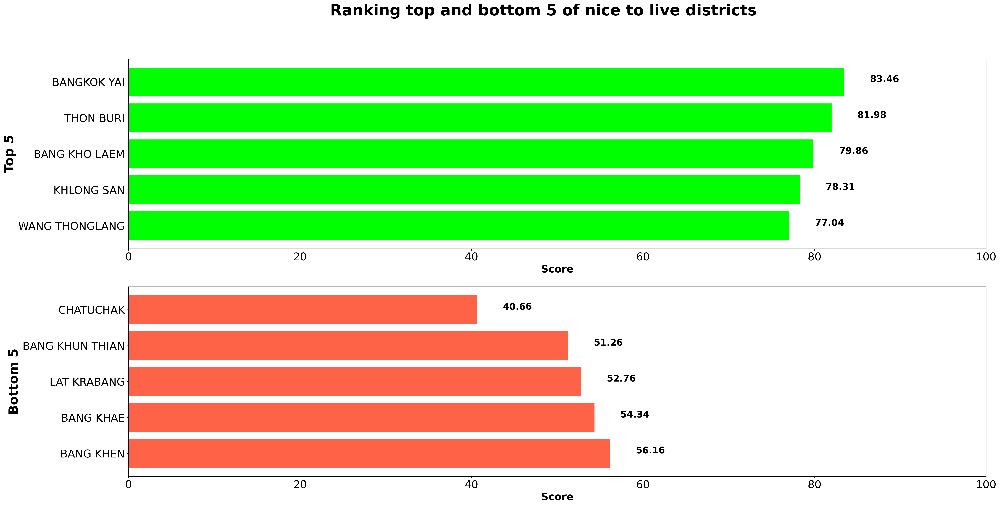

In [115]:
#visualize
top_5_all = top_5_all.iloc[:5,:].sort_values(by = 'normalized_all' ,ascending = True).reset_index(drop = True)
fig, axs = plt.subplots(2, figsize = (30,15), dpi = 300)
fig.suptitle('Ranking top and bottom 5 of nice to live districts', fontsize = 30, fontweight='bold')
axs[0].set_xticklabels([0,20,40,60,80,100],fontsize=21) ##problem 12 : max value of data not equal -> set to be equal
axs[0].set_yticklabels(top_5_all['district_name_en'],fontsize=21)
axs[0].barh(top_5_all['district_name_en'], top_5_all['normalized_all'], color = 'lime')
axs[0].set_xlim([0, 100])#problem 12 : max value of data not equal -> set to be equal
for i, v in enumerate(top_5_all['normalized_all'].round(2)):
    axs[0].text(v +3 , i , v, color='black', fontweight='bold',fontsize = 18)
axs[0].set_ylabel('Top 5', fontsize=25, fontweight='bold')
axs[0].set_xlabel('Score', fontsize=20, fontweight='bold')

bottom_5_all = bottom_5_all.iloc[:5,:].sort_values(by = 'normalized_all' ,ascending = False).reset_index(drop = True)
axs[1].barh(bottom_5_all['district_name_en'], bottom_5_all['normalized_all'])
axs[1].set_xlim([0, 100])
axs[1].set_xticklabels([0,20,40,60,80,100],fontsize=21)
axs[1].set_yticklabels(bottom_5_all['district_name_en'],fontsize=21)
axs[1].barh(bottom_5_all['district_name_en'], bottom_5_all['normalized_all'], color = 'tomato')
axs[1].set_xlim([0, 100])
for i, v in enumerate(bottom_5_all['normalized_all'].round(2)):
    axs[1].text(v +3 , i , v, color='black', fontweight='bold',fontsize = 18)
axs[1].set_ylabel('Bottom 5', fontsize=25, fontweight='bold')
axs[1].set_xlabel('Score', fontsize=20, fontweight='bold')


#plt.savefig("top_livable.jpeg")
#files.download("top_livable.jpeg") 

In [124]:
#to visualize from left to right(low to high)
eat_all = eat_all.sort_values(by = ['mean_eating'], ascending = True).reset_index(drop= True) #problem 8 : data not in ascending -> create a new variable
# Draw plot



fig, ax = plt.subplots(figsize=(30,19), facecolor='white', dpi= 400)
ax.vlines(x=grouped_all_vi.index, ymin=0, ymax=eat_all.mean_eating, color='firebrick', alpha=0.8, linewidth=18)

# Annotate Text
for i, cty in enumerate(eat_all.mean_eating):
    ax.text(i, cty+1, round(cty, 1), horizontalalignment='center') #problem 9 : text not arraged -> have to try increasing value 


# Title, Label, Ticks and Ylim
ax.set_title('Eating District ranking', fontdict={'size':22})
ax.set_ylabel('Score', fontsize=22)
plt.xticks(eat_all.index, eat_all.district_name_en.str.upper(), rotation=65, horizontalalignment='right', fontsize=12)

# Add patches to color the X axis labels
p1 = patches.Rectangle((.764, -0.001), width=.11, height=.125, alpha=.125, facecolor='lime', transform=fig.transFigure) #problem 10 : rectangles not proper -> adjust coordinates 
p2 = patches.Rectangle((.125, -0.001), width=.11, height=.125, alpha=.125, facecolor='crimson', transform=fig.transFigure)
fig.add_artist(p1)
fig.add_artist(p2)
plt.show()
#plt.savefig("District_ranking.png")
#files.download("District_ranking.png") 

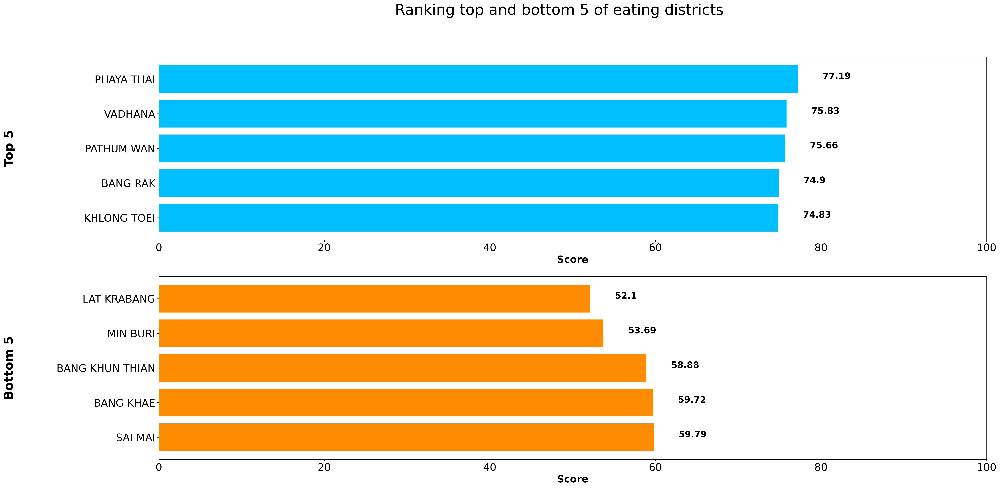

In [117]:
top_5_eat = top_5_eat.iloc[:5,:].sort_values(by = 'mean_eating' ,ascending = True).reset_index(drop = True)
fig, axs = plt.subplots(2, figsize = (30,15), dpi = 300)
fig.suptitle('Ranking top and bottom 5 of eating districts', fontsize = 30)
axs[0].set_xticklabels([0,20,40,60,80,100],fontsize=21)
axs[0].set_yticklabels(top_5_eat['district_name_en'],fontsize=21)
axs[0].barh(top_5_eat['district_name_en'], top_5_eat['mean_eating'], color = 'deepskyblue')
axs[0].set_xlim([0, 100])
for i, v in enumerate(top_5_eat['mean_eating'].round(2)):
    axs[0].text(v +3 , i , v, color='black', fontweight='bold',fontsize = 18)
axs[0].set_ylabel('Top 5', fontsize=25, fontweight='bold')
axs[0].set_xlabel('Score', fontsize=20, fontweight='bold')
axs[0].yaxis.set_label_coords(-0.173, 0.5)


bottom_5_eat = bottom_5_eat.iloc[:5,:].sort_values(by = 'mean_eating' ,ascending = False).reset_index(drop = True)
axs[1].barh(bottom_5_eat['district_name_en'], bottom_5_eat['mean_eating'])
axs[1].set_xlim([0, 100])
axs[1].set_xticklabels([0,20,40,60,80,100],fontsize=21)
axs[1].set_yticklabels(bottom_5_eat['district_name_en'],fontsize=21)
axs[1].barh(bottom_5_eat['district_name_en'], bottom_5_eat['mean_eating'], color = 'darkorange')
axs[1].set_xlim([0, 100])
for i, v in enumerate(bottom_5_eat['mean_eating'].round(2)):
    axs[1].text(v +3 , i , v, color='black', fontweight='bold',fontsize = 18)
axs[1].set_ylabel('Bottom 5', fontsize=25, fontweight='bold')
axs[1].set_xlabel('Score', fontsize=20, fontweight='bold')
axs[1].yaxis.set_label_coords(-0.173, 0.5)


#plt.savefig("top_eating.png")
#files.download("top_eating.png") 


In [125]:
#to visualize from left to right(low to high)
travel_all = travel_all.sort_values(by = ['mean_travel'], ascending = True).reset_index(drop= True) #problem 8 : data not in ascending -> create a new variable
# Draw plot



fig, ax = plt.subplots(figsize=(30,19), facecolor='white', dpi= 400)
ax.vlines(x=travel_all.index, ymin=0, ymax=travel_all.mean_travel, color='firebrick', alpha=0.8, linewidth=18)

# Annotate Text
for i, cty in enumerate(travel_all.mean_travel):
    ax.text(i, cty+1, round(cty, 1), horizontalalignment='center') #problem 9 : text not arraged -> have to try increasing value 


# Title, Label, Ticks and Ylim
ax.set_title('Travel District ranking', fontdict={'size':22})
ax.set_ylabel('Score', fontsize=22)
plt.xticks(travel_all.index, travel_all.district_name_en.str.upper(), rotation=65, horizontalalignment='right', fontsize=12)

# Add patches to color the X axis labels
p1 = patches.Rectangle((.764, -0.001), width=.11, height=.125, alpha=.125, facecolor='lime', transform=fig.transFigure) #problem 10 : rectangles not proper -> adjust coordinates 
p2 = patches.Rectangle((.125, -0.001), width=.11, height=.125, alpha=.125, facecolor='crimson', transform=fig.transFigure)
fig.add_artist(p1)
fig.add_artist(p2)
plt.show()
#plt.savefig("District_ranking.png")
#files.download("District_ranking.png") 

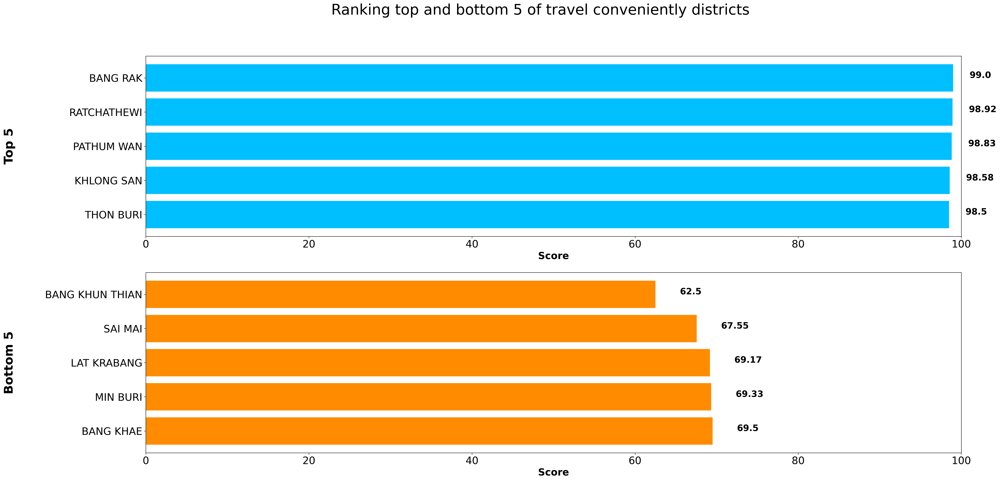

In [119]:
top_5_travel = top_5_travel.iloc[:5,:].sort_values(by = 'mean_travel' ,ascending = True).reset_index(drop = True)
fig, axs = plt.subplots(2, figsize = (30,15), dpi = 300)
fig.suptitle('Ranking top and bottom 5 of travel conveniently districts', fontsize = 30)
axs[0].set_xticklabels([0,20,40,60,80,100],fontsize=21)
axs[0].set_yticklabels(top_5_travel['district_name_en'],fontsize=21)
axs[0].barh(top_5_travel['district_name_en'], top_5_travel['mean_travel'], color = 'deepskyblue')
axs[0].set_xlim([0, 100])
for i, v in enumerate(top_5_travel['mean_travel'].round(2)):
    axs[0].text(v +2 , i , v, color='black', fontweight='bold',fontsize = 18)
axs[0].set_ylabel('Top 5', fontsize=25, fontweight='bold')
axs[0].set_xlabel('Score', fontsize=20, fontweight='bold')
axs[0].yaxis.set_label_coords(-0.16, 0.5)

bottom_5_travel = bottom_5_travel.iloc[:5,:].sort_values(by = 'mean_travel' ,ascending = False).reset_index(drop = True)
axs[1].barh(bottom_5_travel['district_name_en'], bottom_5_travel['mean_travel'])
axs[1].set_xlim([0, 100])
axs[1].set_xticklabels([0,20,40,60,80,100],fontsize=21)
axs[1].set_yticklabels(bottom_5_travel['district_name_en'],fontsize=21)
axs[1].barh(bottom_5_travel['district_name_en'], bottom_5_travel['mean_travel'], color = 'darkorange')
axs[1].set_xlim([0, 100])
for i, v in enumerate(bottom_5_travel['mean_travel'].round(2)):
    axs[1].text(v +3 , i , v, color='black', fontweight='bold',fontsize = 18)
axs[1].set_ylabel('Bottom 5', fontsize=25, fontweight='bold')
axs[1].set_xlabel('Score', fontsize=20, fontweight='bold')
axs[1].yaxis.set_label_coords(-0.16, 0.5)

#plt.savefig("top_travel.png")
#files.download("top_travel.png") 

In [126]:
#to visualize from left to right(low to high)
price_all = price_all.sort_values(by = ['mean_median_rent_price_sqm_district_2021'], ascending = True).reset_index(drop= True) #problem 8 : data not in ascending -> create a new variable
# Draw plot



fig, ax = plt.subplots(figsize=(30,19), facecolor='white', dpi= 400)
ax.vlines(x=price_all.index, ymin=0, ymax=price_all.mean_median_rent_price_sqm_district_2021, color='firebrick', alpha=0.8, linewidth=18)

# Annotate Text
for i, cty in enumerate(price_all.mean_median_rent_price_sqm_district_2021):
    ax.text(i, cty+1, round(cty, 1), horizontalalignment='center') #problem 9 : text not arraged -> have to try increasing value 


# Title, Label, Ticks and Ylim
ax.set_title('Price District ranking', fontdict={'size':22})
ax.set_ylabel('Score', fontsize=22)
plt.xticks(price_all.index, price_all.district_name_en.str.upper(), rotation=65, horizontalalignment='right', fontsize=12)

# Add patches to color the X axis labels
p1 = patches.Rectangle((.764, -0.001), width=.11, height=.125, alpha=.125, facecolor='lime', transform=fig.transFigure) #problem 10 : rectangles not proper -> adjust coordinates 
p2 = patches.Rectangle((.125, -0.001), width=.11, height=.125, alpha=.125, facecolor='crimson', transform=fig.transFigure)
fig.add_artist(p1)
fig.add_artist(p2)
plt.show()
#plt.savefig("District_ranking.png")
#files.download("District_ranking.png") 

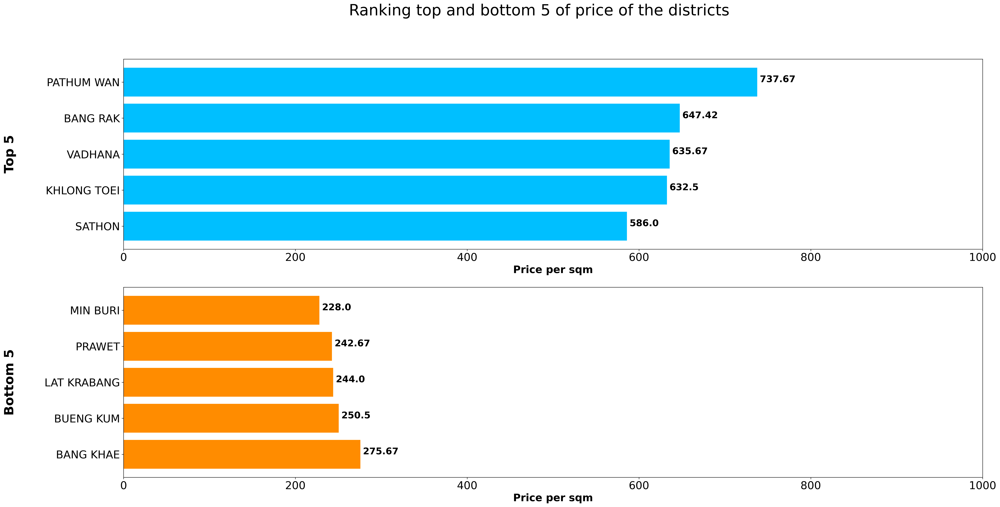

In [122]:
top_5_price = top_5_price.iloc[:5,:].sort_values(by = 'mean_median_rent_price_sqm_district_2021' ,ascending = True).reset_index(drop = True)
fig, axs = plt.subplots(2, figsize = (30,15), dpi = 300)
fig.suptitle('Ranking top and bottom 5 of price of the districts', fontsize = 30)
axs[0].set_xticklabels([0,200,400,600,800,1000],fontsize=21)
axs[0].set_yticklabels(top_5_price['district_name_en'],fontsize=21)
axs[0].barh(top_5_price['district_name_en'], top_5_price['mean_median_rent_price_sqm_district_2021'], color = 'deepskyblue')
axs[0].set_xlim([0, 1000])
for i, v in enumerate(top_5_price['mean_median_rent_price_sqm_district_2021'].round(2)):
    axs[0].text(v +3 , i , v, color='black', fontweight='bold',fontsize = 18)
axs[0].set_ylabel('Top 5', fontsize=25, fontweight='bold')
axs[0].set_xlabel('Price per sqm', fontsize=20, fontweight='bold')
axs[0].yaxis.set_label_coords(-0.125, 0.5)

bottom_5_price = bottom_5_price.iloc[:5,:].sort_values(by = 'mean_median_rent_price_sqm_district_2021' ,ascending = False).reset_index(drop = True)
axs[1].barh(bottom_5_price['district_name_en'], bottom_5_price['mean_median_rent_price_sqm_district_2021'])
axs[1].set_xlim([0, 100])
axs[1].set_xticklabels([0,200,400,600,800,1000],fontsize=21)
axs[1].set_yticklabels(bottom_5_price['district_name_en'],fontsize=21)
axs[1].barh(bottom_5_price['district_name_en'], bottom_5_price['mean_median_rent_price_sqm_district_2021'], color = 'darkorange')
axs[1].set_xlim([0, 1000])
for i, v in enumerate(bottom_5_price['mean_median_rent_price_sqm_district_2021'].round(2)):
    axs[1].text(v +3 , i , v, color='black', fontweight='bold',fontsize = 18)
axs[1].set_ylabel('Bottom 5', fontsize=25, fontweight='bold')
axs[1].set_xlabel('Price per sqm', fontsize=20, fontweight='bold')
axs[1].yaxis.set_label_coords(-0.125, 0.5)

#plt.savefig("top_price.png")
#files.download("top_price.png") 